In [ ]:
import os
import ast
import shutil as sh
from pathlib import Path
import random

import numpy as np
import pandas as pd

import PIL

import torch

from tqdm.auto import tqdm

from IPython.display import Image, clear_output

import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
!pwd

/content


In [ ]:
!ls

sample_data


In [19]:
#mount drive
%cd ..
from google.colab import drive
drive.mount('/content/gdrive')

/content/gdrive/MyDrive/DL
Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [20]:
# this creates a symbolic link so that now the path /content/gdrive/My\ Drive/ is equal to /mydrive
!ln -s /content/gdrive/My\ Drive/ /mydrive

# list the contents of /mydrive
#!ls /mydrive

ln: failed to create symbolic link '/mydrive/My Drive': File exists


In [21]:
%cd /mydrive/DL

/content/gdrive/MyDrive/DL


In [ ]:
!ls 

DOTA_devkit		 model_trainsplit.pth  trainsplit_50.json  weights
model_10.pth		 test		       trainsplit.json	   yolo
model_1.pth		 testsplit_10	       val		   yolov5
model_april12.pth	 train_10	       valsplit
model.pth		 train.json	       valsplit_10.json
model_trainsplit_10.pth  trainsplit_10.json    valsplit_50.json


In [ ]:
#!git clone https://github.com/ultralytics/yolov5  # clone repo

Cloning into 'yolov5'...
remote: Enumerating objects: 15365, done.
remote: Counting objects: 100% (10/10), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 15365 (delta 1), reused 7 (delta 1), pack-reused 15355
Receiving objects: 100% (15365/15365), 14.36 MiB | 12.48 MiB/s, done.
Resolving deltas: 100% (10501/10501), done.


In [22]:
!pip install -qr yolov5/requirements.txt  # install dependencies

In [23]:
%cd /mydrive/DL

/content/gdrive/My Drive/DL


In [24]:
!sudo apt-get install swig

Reading package lists... Done
Building dependency tree       
Reading state information... Done
swig is already the newest version (4.0.1-5build1).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.


In [25]:
%cd ..
%cd /mydrive/DL/DOTA_devkit

/content/gdrive/My Drive
/content/gdrive/My Drive/DL/DOTA_devkit


In [26]:
!swig -c++ -python polyiou.i
!python setup.py build_ext --inplace

running build_ext
building '_polyiou' extension
x86_64-linux-gnu-gcc -pthread -Wno-unused-result -Wsign-compare -DNDEBUG -g -fwrapv -O2 -Wall -g -fstack-protector-strong -Wformat -Werror=format-security -g -fwrapv -O2 -g -fstack-protector-strong -Wformat -Werror=format-security -Wdate-time -D_FORTIFY_SOURCE=2 -fPIC -I/usr/include/python3.9 -c polyiou.cpp -o build/temp.linux-x86_64-3.9/polyiou.o
polyiou.cpp: In function ‘double intersectArea(Point, Point, Point, Point)’:
polyiou.cpp:88:5: warning: this ‘if’ clause does not guard... [-Wmisleading-indentation]
   88 |     if(s1*s2==-1) res=-res;return res;
      |     ^~
polyiou.cpp:88:28: note: ...this statement, but the latter is misleadingly indented as if it were guarded by the ‘if’
   88 |     if(s1*s2==-1) res=-res;return res;
      |                            ^~~~~~
x86_64-linux-gnu-gcc -pthread -Wno-unused-result -Wsign-compare -DNDEBUG -g -fwrapv -O2 -Wall -g -fstack-protector-strong -Wformat -Werror=format-security -g -fwrapv -

In [27]:
!pip install -v -e .

Using pip 23.0.1 from /usr/local/lib/python3.9/dist-packages/pip (python 3.9)
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/gdrive/MyDrive/DL/DOTA_devkit
  Running command python setup.py egg_info
  running egg_info
  creating /tmp/pip-pip-egg-info-4gvqh4ew/polyiou.egg-info
  writing /tmp/pip-pip-egg-info-4gvqh4ew/polyiou.egg-info/PKG-INFO
  writing dependency_links to /tmp/pip-pip-egg-info-4gvqh4ew/polyiou.egg-info/dependency_links.txt
  writing top-level names to /tmp/pip-pip-egg-info-4gvqh4ew/polyiou.egg-info/top_level.txt
  writing manifest file '/tmp/pip-pip-egg-info-4gvqh4ew/polyiou.egg-info/SOURCES.txt'
  reading manifest file '/tmp/pip-pip-egg-info-4gvqh4ew/polyiou.egg-info/SOURCES.txt'
  writing manifest file '/tmp/pip-pip-egg-info-4gvqh4ew/polyiou.egg-info/SOURCES.txt'
  Preparing metadata (setup.py) ... done
  Attempting uninstall: polyiou
    Found existing installation: polyiou 0.1
    Can't uni

In [ ]:
# Splitting the files both images and labeltxt
#!python ImgSplit_multi_process_1.py

padding: True
/usr/local/lib/python3.9/dist-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/usr/local/lib/python3.9/dist-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/usr/local/lib/python3.9/dist-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/usr/local/lib/python3.9/dist-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/usr/local/lib/python3.9/dist-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)
/usr/local/lib/python3.9/dist-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return

In [ ]:
# Checking if images after split, boxes are accurately pointing
import matplotlib.patches as patches
def plot_img_bbox(img, target):
    # plot the image and bboxes
    # Bounding boxes are defined as follows: x-min y-min width height
    fig, a = plt.subplots(1,1)
    fig.set_size_inches(5,5)
    a.imshow(img)
    for box in (target['boxes']):
        x, y, width, height  = box[0], box[1], box[2]-box[0], box[3]-box[1]
        rect = patches.Rectangle((x, y),
                                 width, height,
                                 linewidth = 2,
                                 edgecolor = 'r',
                                 facecolor = 'none')

        # Draw the bounding box on top of the image
        a.add_patch(rect)
    plt.show()

In [ ]:
import cv2
image_path = '/content/gdrive/MyDrive/Data/trainsplit/images/P0054__1__1168___0.png'
img = cv2.imread(image_path)
#img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)


In [ ]:
target = {}
target["boxes"] = [[754, 827, 819, 890],[149, 716, 194, 911], [203, 891, 331, 1024], [228, 907, 353, 1024], [607, 401, 772, 428], [593, 427, 776, 459], [554, 485, 729, 521], [501, 540, 677, 579], [437, 660, 511, 684], [423, 696, 474, 718]
                   ,[316, 707, 511, 752],[334, 378, 376, 546],[124, 363, 162, 534], [805, 1000, 826, 1024], [712, 902, 751, 935]]
target["labels"] = [6, 6, 6, 6, 6, 6, 6, 6, 6,6,6, 6,6,5, 5]
target["area"] = [1747.5, 7313.5, 4105.0, 4240.5, 4075.0, 4791.0, 5287.5, 4980.0, 1488.5,789.0,6202.0, 5701.5, 5627.0, 240.0, 529.5]
target["iscrowd"] = [0,0,0,0,0,0,0,0]
# image_id
target["image_id"] = [3,3,3,3,3,3,3,3]

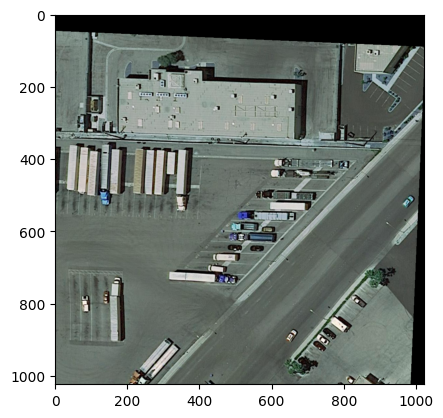

In [ ]:
fig, a = plt.subplots(1,1)
a.imshow(img)

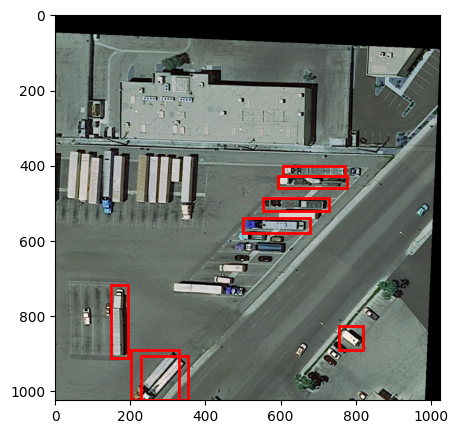

In [ ]:
plot_img_bbox(img, target)

In [ ]:
# Converting train files from dota to yolo format
#!python dota2yolov5.py  #RUN ONLY ONCE

In [ ]:
# Converting val files from dota to yolo format
#!python dota2yolov5_1.py  #for train labels


Start to conver DOTA's labelTxt-v1.5 dataset for qqwweee/keras-yolo3


In [ ]:
# Splitting the files both images and labeltxt
#!python ImgSplit_multi_process_1.py

padding: True


In [ ]:
!pwd

/content/gdrive/MyDrive/DL/DOTA_devkit


In [28]:
%cd ..
%cd /content/gdrive/MyDrive/DL/yolov5

/content/gdrive/MyDrive/DL
/content/gdrive/MyDrive/DL/yolov5


In [ ]:
import os
FOLDER_PATH = 'labelTxt'
ROOT_PATH = '/content/gdrive/MyDrive/DL/yolo/data_512/train'
print(len(os.listdir(os.path.join(ROOT_PATH, FOLDER_PATH))))

17991


In [ ]:
import os
FOLDER_PATH = 'images'
ROOT_PATH = '/content/gdrive/MyDrive/DL/yolo/data_512/train'
print(len(os.listdir(os.path.join(ROOT_PATH, FOLDER_PATH))))

17990


In [ ]:
import os
FOLDER_PATH = 'labels'
ROOT_PATH = '/content/gdrive/MyDrive/DL/yolo/data_512/train'
print(len(os.listdir(os.path.join(ROOT_PATH, FOLDER_PATH))))

17991


In [ ]:
import os
FOLDER_PATH = 'images'
ROOT_PATH = '/content/gdrive/MyDrive/DL/yolo/data_512/val'
print(len(os.listdir(os.path.join(ROOT_PATH, FOLDER_PATH))))

6624


In [ ]:
import os
FOLDER_PATH = 'labelTxt'
ROOT_PATH = '/content/gdrive/MyDrive/DL/yolo/data_512/val'
print(len(os.listdir(os.path.join(ROOT_PATH, FOLDER_PATH))))

6624


In [ ]:
import os
FOLDER_PATH = 'labels'
ROOT_PATH = '/content/gdrive/MyDrive/DL/yolo/data_512/val'
print(len(os.listdir(os.path.join(ROOT_PATH, FOLDER_PATH))))

6624


In [ ]:
#To check for files in labels and images when the numbers doesnt match
import glob 
#list_signal =  glob.glob('/content/gdrive/MyDrive/DL/yolo/data_split/val/labelTxt' + '/*.txt')
list_zvec = glob.glob('/content/gdrive/MyDrive/DL/yolo/data_512/train/labelTxt' + '/*.txt')

for zvec in list_zvec:
     img_name = zvec.split('.')[0].split('/')[-1]
     flag = os.path.isfile('/content/gdrive/MyDrive/DL/yolo/data_512/train/images/' + img_name + ".png")
     if flag == False:
         print(img_name)



P0286__1__425___393


In [ ]:
# # Checking if file exists
import os
#print(os.path.isfile('/content/gdrive/MyDrive/DL/valsplit/images/P2794__1__0___1648.png'))
#print(os.path.isfile('/content/gdrive/MyDrive/DL/valsplit/labelTxt/P2794__1__0___1648.txt'))
print(os.path.isfile('/content/gdrive/MyDrive/DL/yolo/data_512/train/images/P0286__1__425___393.png'))
print(os.path.isfile('/content/gdrive/MyDrive/DL/yolo/data_512/train/labelTxt/P0286__1__425___393.txt'))
print(os.path.isfile('/content/gdrive/MyDrive/DL/yolo/data_512/train/labels/P0286__1__425___393.txt'))

False
False
False


In [29]:
%cd /content/gdrive/MyDrive/DL/yolov5

/content/gdrive/MyDrive/DL/yolov5


In [ ]:
CONFIG = """
# train and val datasets (image directory or *.txt file with image paths)
train: /content/gdrive/MyDrive/DL/yolo/data_512/train/images
val: /content/gdrive/MyDrive/DL/yolo/data_512/val/images

# number of classes
nc: 15

# class names
names: ['plane', 'baseball-diamond', 'bridge', 'ground-track-field', 'small-vehicle', 'large-vehicle', 'ship', 'tennis-court','basketball-court'
, 'storage-tank',  'soccer-ball-field', 'roundabout', 'harbor', 'swimming-pool', 'helicopeter']
"""

with open("dataset.yaml", "w") as f:
    f.write(CONFIG)

In [ ]:
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 2.0.0+cu118 CPU


In [30]:
!pip uninstall -y wandb

In [31]:
# remove previous runs so that following cells works with 'exp' folder
!rm -rf /content/gdrive/MyDrive/DL/yolov5/runs

## Baseline Model (using the dataset as it is)

In [ ]:
# BASELINE MODEL
#!python /content/gdrive/MyDrive/DL/yolov5/train.py --cfg models/yolov5s.yaml --img 640 --batch-size 4 --epochs 10 --data /content/gdrive/MyDrive/DL/yolov5/dataset.yaml --weights yolov5s.pt

2023-04-04 20:18:06.410817: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-04 20:18:09.279556: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=yolov5s.pt, cfg=models/yolov5s.yaml, data=/content/gdrive/MyDrive/DL/yolov5/dataset.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=4, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1,

In [ ]:
# Detection
!python /content/gdrive/MyDrive/DL/yolov5/detect.py --source /content/gdrive/MyDrive/DL/yolov5/test/img/ --img-size 1024 --weights /content/gdrive/MyDrive/DL/yolov5/weights/best.pt --conf 0.5

detect: weights=['/content/gdrive/MyDrive/DL/yolov5/weights/best.pt'], source=/content/gdrive/MyDrive/DL/yolov5/test/img/, data=data/coco128.yaml, imgsz=[1024, 1024], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-133-gcca5e21 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7050580 parameters, 0 gradients, 15.9 GFLOPs
image 1/3 /content/gdrive/MyDrive/DL/yolov5/test/img/P0014.png: 864x1024 4 small-vehicles, 25 large-vehicles, 45.0ms
image 2/3 /content/gdrive/MyDrive/DL/yolov5/test/img/P0017.png: 1024x480 47 planes, 40.9ms
image 3/3 /content/gdrive/MyDrive/DL/yolov5/test/img/P0031.png: 736x1024 4 small-vehicles, 16

## Images with 1024x1024 split

In [ ]:
# Model with 1024x1024 image split on entire dataset
#!python /content/gdrive/MyDrive/DL/yolov5/train.py --cfg models/yolov5s.yaml --img 1024 --batch-size 16 --epochs 10 --data /content/gdrive/MyDrive/DL/yolov5/dataset.yaml --weights yolov5s.pt

In [ ]:
!pwd

/content/gdrive/My Drive/DL/yolov5


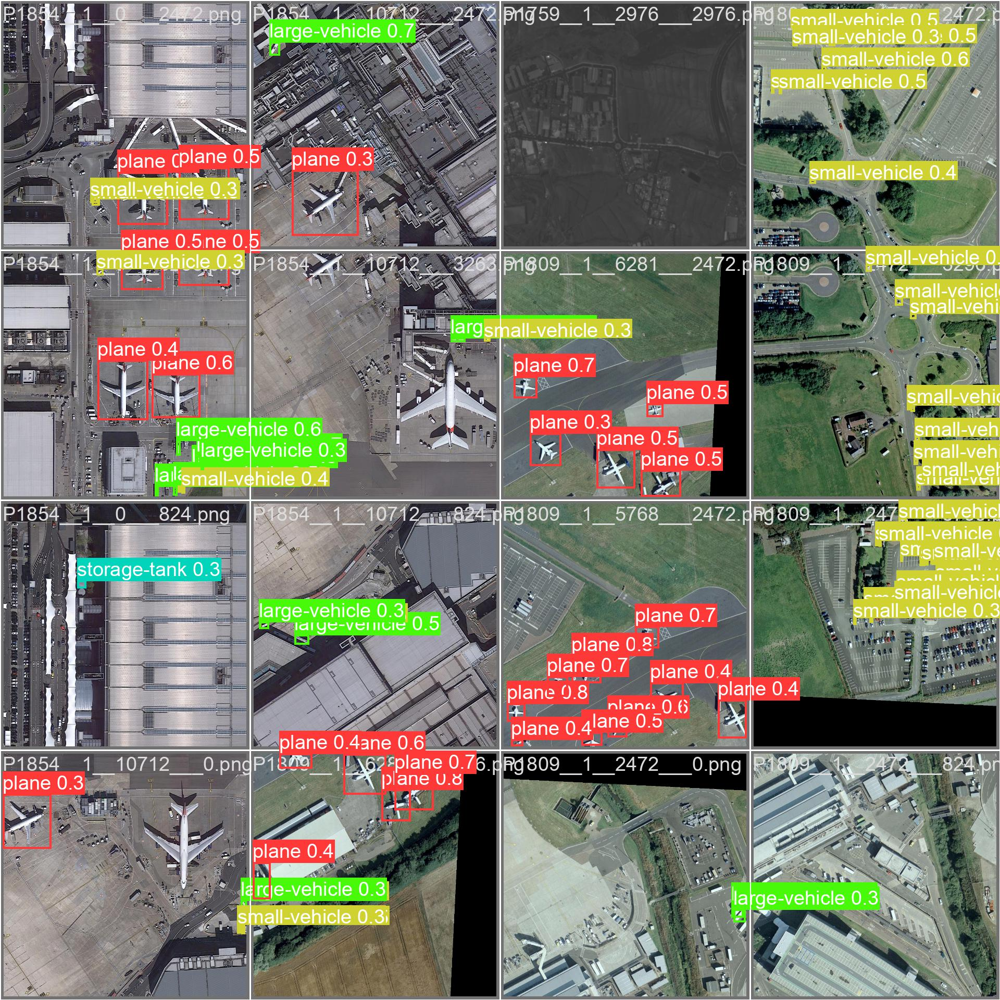

In [ ]:
# predictions on batch 1
Image(filename='/content/gdrive/My Drive/DL/yolov5/runs/train/exp/val_batch2_pred.jpg', width=800)

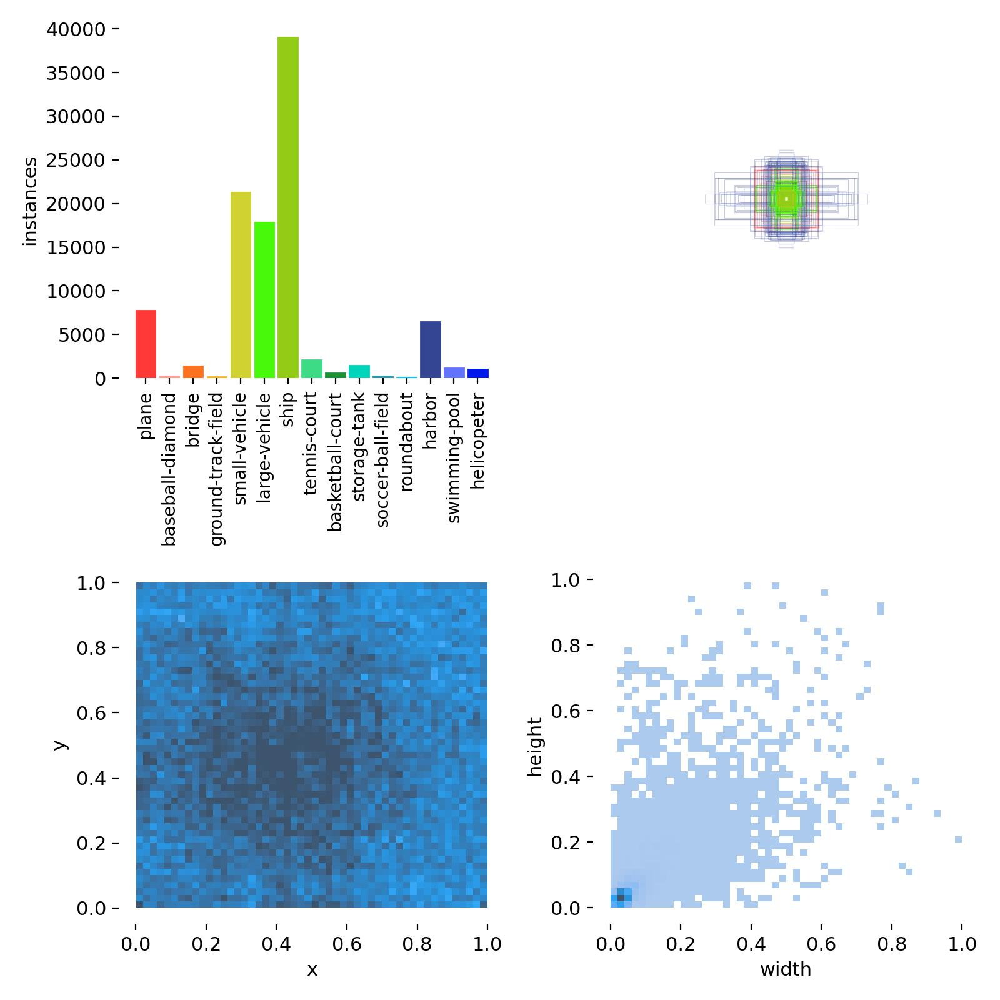

In [ ]:
# analysis of labels and boxes
Image(filename='/content/gdrive/My Drive/DL/yolov5/runs/train/exp/labels.jpg', width=800)

In [ ]:
# Detection
!python /content/gdrive/MyDrive/DL/yolov5/detect.py --source /content/gdrive/MyDrive/DL/yolov5/test/ --img-size 1024 --weights /content/gdrive/MyDrive/DL/yolov5/runs/train/exp/weights/best.pt --conf 0.5

detect: weights=['/content/gdrive/MyDrive/DL/yolov5/runs/train/exp/weights/best.pt'], source=/content/gdrive/MyDrive/DL/yolov5/test/, data=yolov5/data/coco128.yaml, imgsz=[1024, 1024], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-133-gcca5e21 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7050580 parameters, 0 gradients, 15.9 GFLOPs
image 1/3 /content/gdrive/MyDrive/DL/yolov5/test/P0014.png: 864x1024 3 small-vehicles, 43 large-vehicles, 47.4ms
image 2/3 /content/gdrive/MyDrive/DL/yolov5/test/P0017.png: 1024x480 48 planes, 46.7ms
image 3/3 /content/gdrive/MyDrive/DL/yolov5/test/P0031.png: 736x1024 244 shi

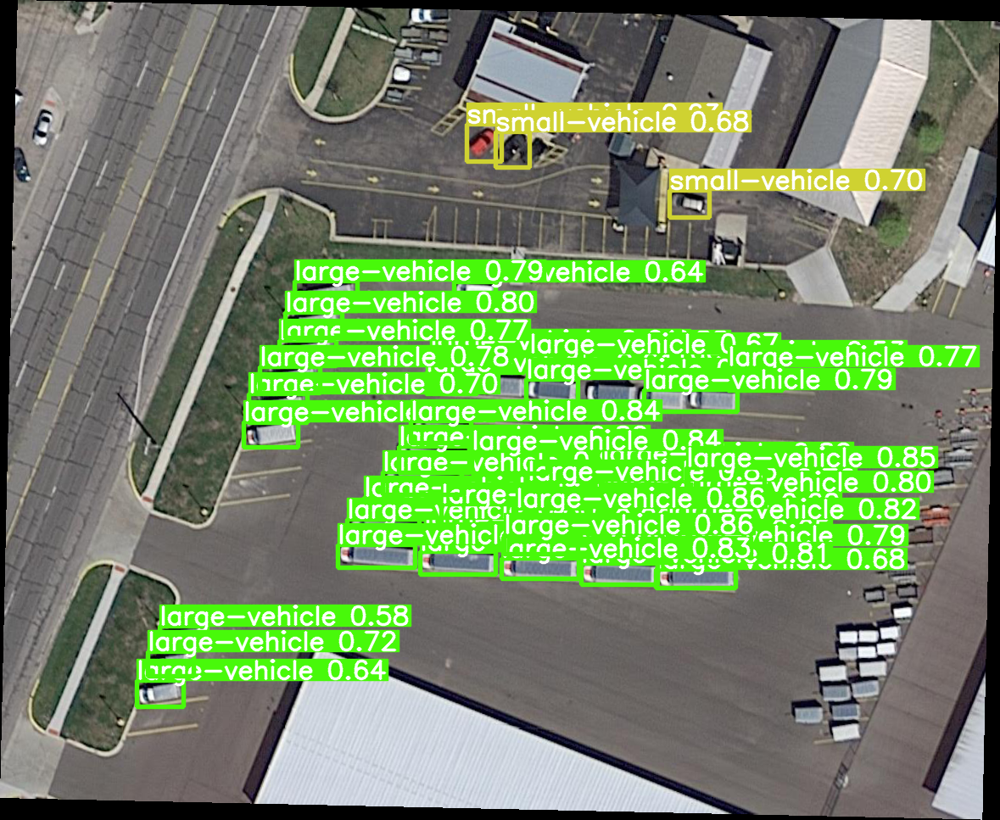

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob('/content/gdrive/MyDrive/DL/yolov5/runs/detect/exp3/*.png'):
      display(Image(filename=image_path, width=1024))
      print("\n")

## Image split 512x512 only 10 imgs

In [ ]:
#!python /content/gdrive/MyDrive/DL/yolov5/train.py --cfg models/yolov5s.yaml --img 512 --batch-size 4 --epochs 10 --data /content/gdrive/MyDrive/DL/yolov5/dataset.yaml --weights yolov5s.pt

2023-04-10 21:40:44.313462: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-10 21:40:45.486012: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=yolov5s.pt, cfg=models/yolov5s.yaml, data=/content/gdrive/MyDrive/DL/yolov5/dataset.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=4, imgsz=512, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1,

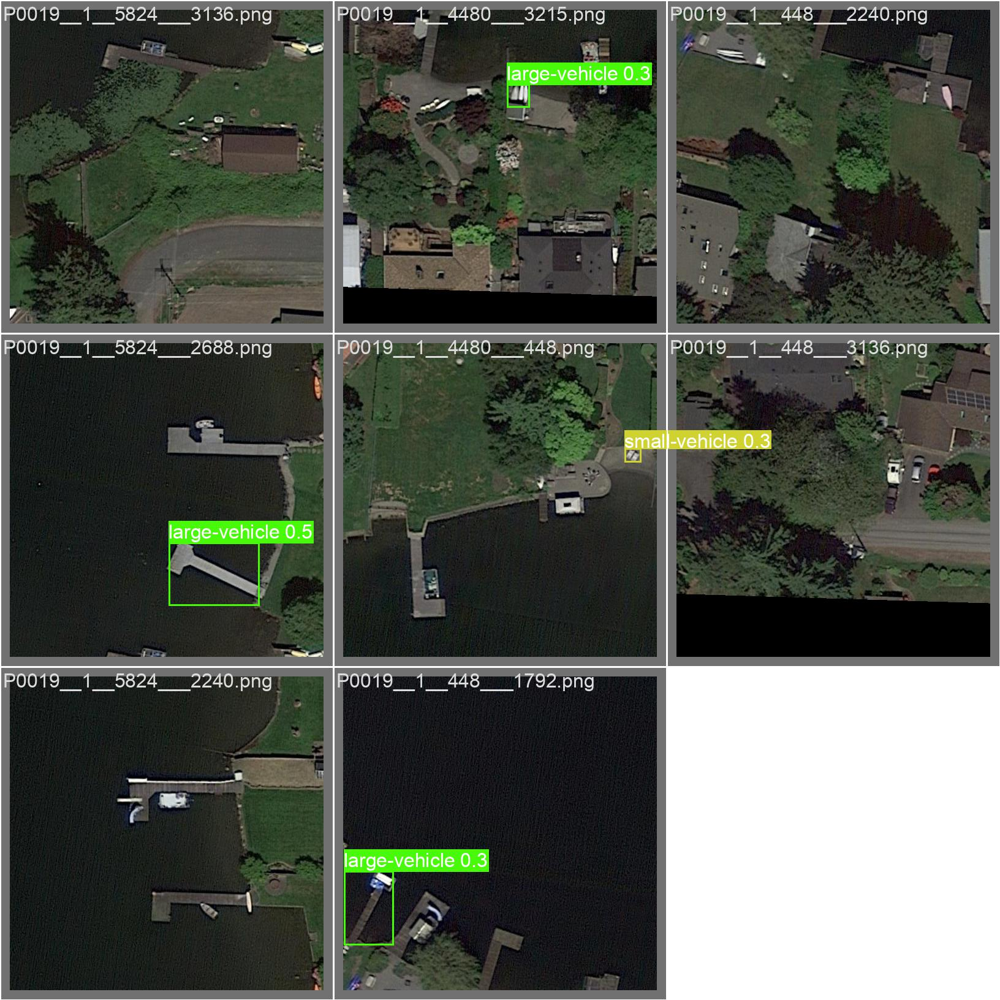

In [ ]:
Image(filename='/content/gdrive/My Drive/DL/yolov5/runs/train/exp/val_batch2_pred.jpg', width=800)

In [ ]:
# Detection
!python /content/gdrive/MyDrive/DL/yolov5/detect.py --source /content/gdrive/MyDrive/DL/yolov5/test/ --img-size 512 --weights /content/gdrive/MyDrive/DL/yolov5/runs/train/exp/weights/best.pt --conf 0.5

detect: weights=['/content/gdrive/MyDrive/DL/yolov5/runs/train/exp/weights/best.pt'], source=/content/gdrive/MyDrive/DL/yolov5/test/, data=data/coco128.yaml, imgsz=[512, 512], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-133-gcca5e21 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7050580 parameters, 0 gradients, 15.9 GFLOPs
image 1/3 /content/gdrive/MyDrive/DL/yolov5/test/P0014.png: 448x512 1 large-vehicle, 60.9ms
image 2/3 /content/gdrive/MyDrive/DL/yolov5/test/P0017.png: 512x256 (no detections), 62.4ms
image 3/3 /content/gdrive/MyDrive/DL/yolov5/test/P0031.png: 384x512 3 large-vehicles, 41.9ms
Speed: 0.5ms pr

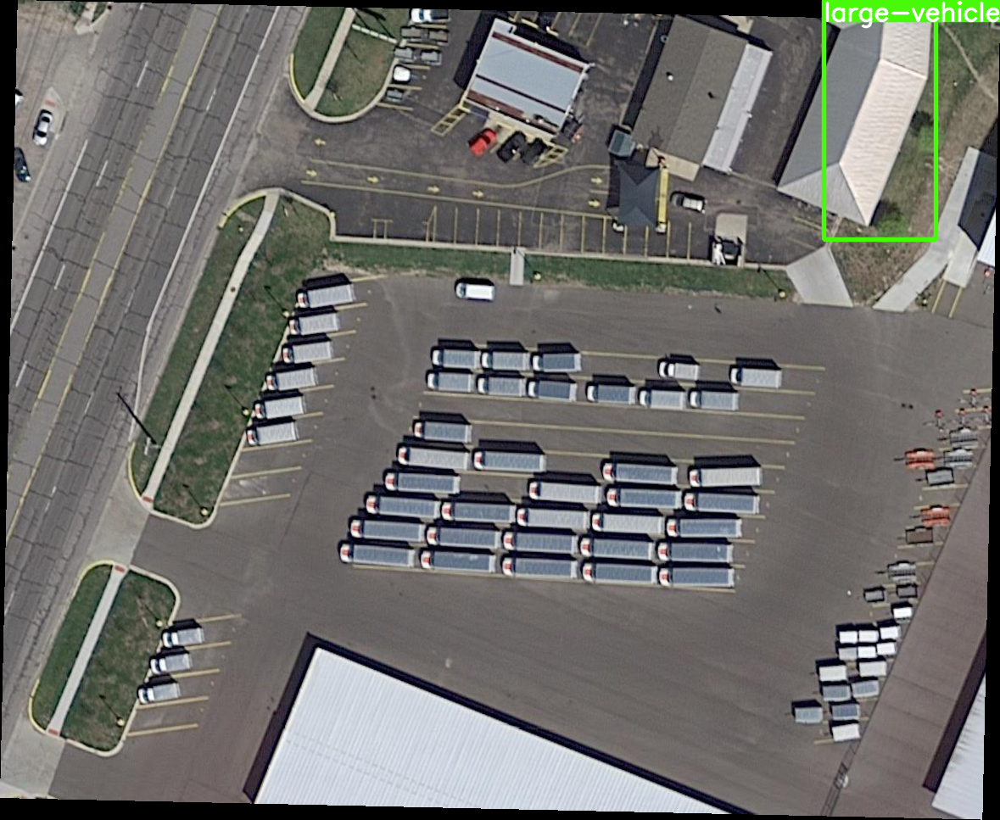

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob('/content/gdrive/MyDrive/DL/yolov5/runs/detect/exp2/*.png'):
      display(Image(filename=image_path, width=512))
      print("\n")

## Image 512x512 with momentum 0.99 and lr0 = 0.0001

In [ ]:
!python /content/gdrive/MyDrive/DL/yolov5/train.py --cfg models/yolov5s.yaml --img 512 --batch-size 4 --epochs 20 --data /content/gdrive/MyDrive/DL/yolov5/dataset.yaml --weights yolov5s.pt

2023-04-14 14:59:28.030419: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-14 14:59:29.342309: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=yolov5s.pt, cfg=models/yolov5s.yaml, data=/content/gdrive/MyDrive/DL/yolov5/dataset.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=20, batch_size=4, imgsz=512, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1,

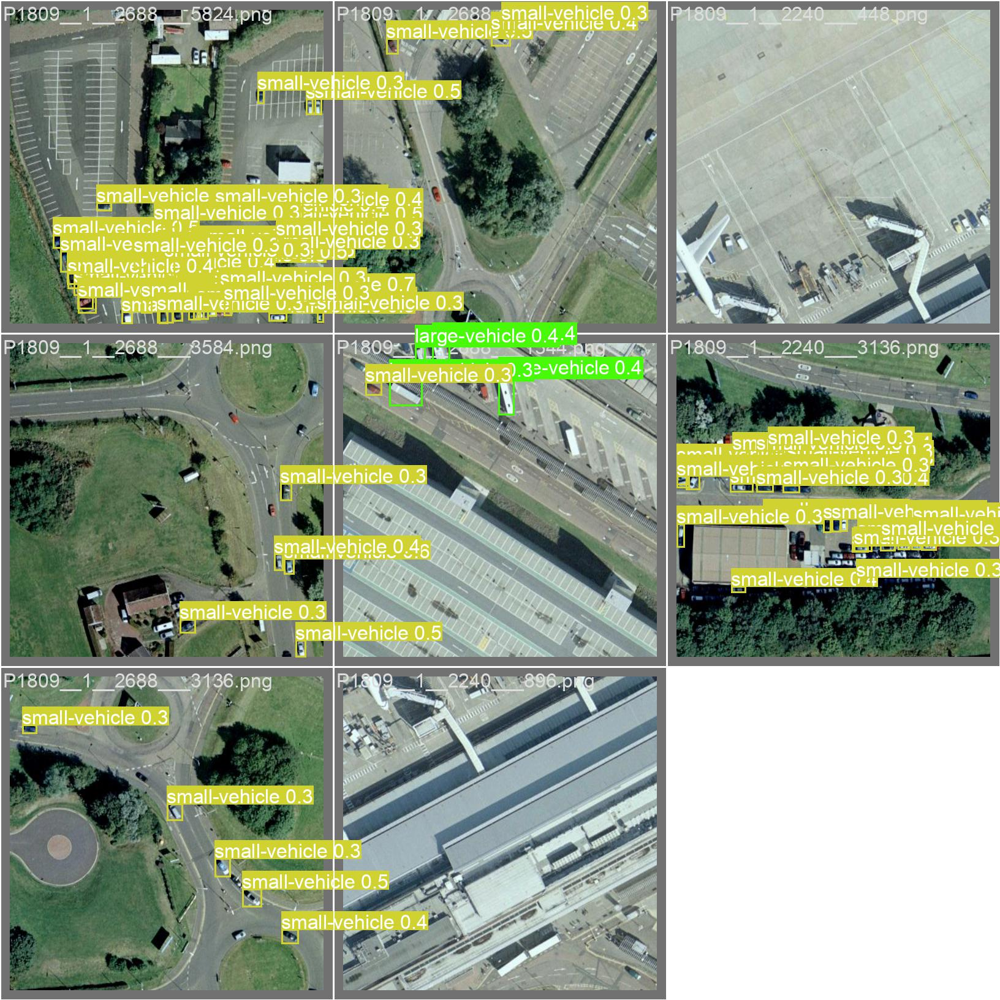

In [ ]:
# predictions on batch 1
Image(filename='/content/gdrive/My Drive/DL/yolov5/runs/train/exp/val_batch1_pred.jpg', width=800)

In [ ]:
# Detection
!python /content/gdrive/MyDrive/DL/yolov5/detect.py --source /content/gdrive/MyDrive/DL/yolov5/test/ --img-size 512 --weights /content/gdrive/MyDrive/DL/yolov5/runs/train/exp/weights/best.pt --conf 0.5

detect: weights=['/content/gdrive/MyDrive/DL/yolov5/runs/train/exp/weights/best.pt'], source=/content/gdrive/MyDrive/DL/yolov5/test/, data=data/coco128.yaml, imgsz=[512, 512], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-133-gcca5e21 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7050580 parameters, 0 gradients, 15.9 GFLOPs
image 1/3 /content/gdrive/MyDrive/DL/yolov5/test/P0014.png: 448x512 3 small-vehicles, 39 large-vehicles, 43.4ms
image 2/3 /content/gdrive/MyDrive/DL/yolov5/test/P0017.png: 512x256 6 planes, 43.0ms
image 3/3 /content/gdrive/MyDrive/DL/yolov5/test/P0031.png: 384x512 3 ships, 44.8ms
Speed: 0.5m

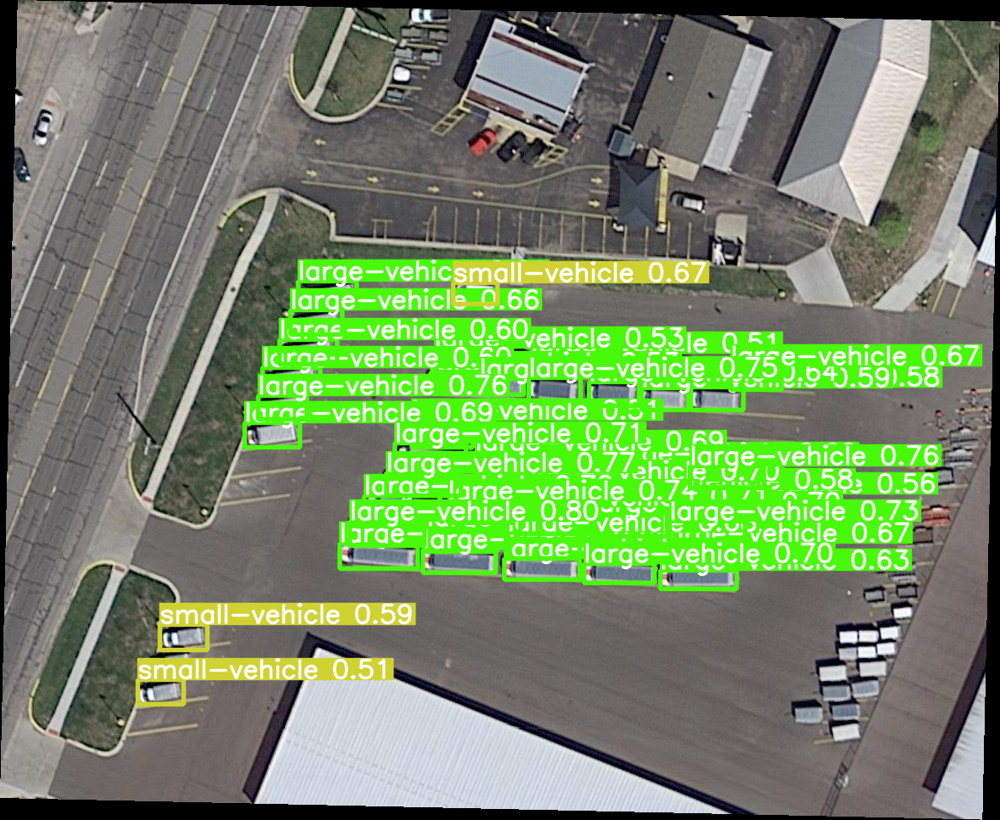

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob('/content/gdrive/MyDrive/DL/yolov5/runs/detect/exp/*.png'):
      display(Image(filename=image_path, width=1024))
      print("\n")

## Images 512x512

In [32]:
!python /content/gdrive/MyDrive/DL/yolov5/train.py --cfg models/yolov5s.yaml --img 512 --batch-size 4 --epochs 10 --data /content/gdrive/MyDrive/DL/yolov5/dataset.yaml --weights yolov5s.pt

2023-04-18 16:12:43.014768: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-18 16:12:46.326926: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=yolov5s.pt, cfg=models/yolov5s.yaml, data=/content/gdrive/MyDrive/DL/yolov5/dataset.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=4, imgsz=512, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1,